# RFM-сегментация пользователей интернет-магазина
## Задание
Необходимо провести RFM-сегментацию пользователей интернет-магазина. В качестве исходных данных даны 3 csv-файла: 
<ul><li>таблица с уникальными идентификаторами пользователей;</li>
<li>таблица заказов;</li>
<li>таблица с товарными позициями, входящими в заказы.</li></ul>

## Импорт библиотек, настройка графиков

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

from datetime import datetime, timedelta


%matplotlib inline

In [2]:
# Сразу зададим общие параметры для будущих картинок.
sns.set_theme(
    style='whitegrid',
    font_scale=2,
    palette='dark',
    rc={'figure.figsize': (16, 9)}
)

## Считывание и предварительный анализ данных

In [3]:
# Считываем данные по ссылкам с яндекс-диска.
customers = pd.read_csv('https://getfile.dokpub.com/yandex/get/https://disk.yandex.ru/d/QXrVDUoQvFhIcg')
orders    = pd.read_csv('https://getfile.dokpub.com/yandex/get/https://disk.yandex.ru/d/0zWmh1bYP6REbw')
items     = pd.read_csv('https://getfile.dokpub.com/yandex/get/https://disk.yandex.ru/d/xCsQ0FiC-Ue4Lg')

In [4]:
customers.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99441 entries, 0 to 99440
Data columns (total 5 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   customer_id               99441 non-null  object
 1   customer_unique_id        99441 non-null  object
 2   customer_zip_code_prefix  99441 non-null  int64 
 3   customer_city             99441 non-null  object
 4   customer_state            99441 non-null  object
dtypes: int64(1), object(4)
memory usage: 3.8+ MB


In [5]:
orders.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99441 entries, 0 to 99440
Data columns (total 8 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   order_id                       99441 non-null  object
 1   customer_id                    99441 non-null  object
 2   order_status                   99441 non-null  object
 3   order_purchase_timestamp       99441 non-null  object
 4   order_approved_at              99281 non-null  object
 5   order_delivered_carrier_date   97658 non-null  object
 6   order_delivered_customer_date  96476 non-null  object
 7   order_estimated_delivery_date  99441 non-null  object
dtypes: object(8)
memory usage: 6.1+ MB


In [6]:
items.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112650 entries, 0 to 112649
Data columns (total 7 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   order_id             112650 non-null  object 
 1   order_item_id        112650 non-null  int64  
 2   product_id           112650 non-null  object 
 3   seller_id            112650 non-null  object 
 4   shipping_limit_date  112650 non-null  object 
 5   price                112650 non-null  float64
 6   freight_value        112650 non-null  float64
dtypes: float64(2), int64(1), object(4)
memory usage: 6.0+ MB


Смотрим, что считалось. Отметим, что в orders есть пустые значения, остальные таблицы заполнены.  
Вероятно, какие-то заказы ещё не подтверждены, какие-то не переданы логистам, какие-то не доставлены.
___
Посмотрим, как выглядят таблицы.

In [7]:
customers.head()

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP


In [8]:
orders.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00


In [9]:
items.head()

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14


Проверим что с уникальностью позиций.

In [10]:
customers.customer_id.nunique()

99441

In [11]:
customers.customer_unique_id.nunique() # Некоторые покупатели совершают по несколько покупок.

96096

In [12]:
orders.customer_id.nunique()

99441

In [13]:
orders.customer_id.nunique() == customers.customer_id.nunique() # Заказы не потерялись.

True

In [14]:
orders.order_id.nunique() 

99441

In [15]:
orders.order_id.nunique() == orders.customer_id.nunique() # Кажется, избыточная информация 

True

In [16]:
items.order_id.nunique()

98666

In [17]:
items.order_id.nunique() == orders.order_id.nunique() # А тут не хватает. Интересно, почему?
# Кажется, некоторые данные по заказам утеряны

False

Пример структуры данных можно визуализировать по order_id == 00143d0f86d6fbd9f9b38ab440ac16f5. 
Ну, попробуем.

In [18]:
items.query("order_id == '00143d0f86d6fbd9f9b38ab440ac16f5'")

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
32,00143d0f86d6fbd9f9b38ab440ac16f5,1,e95ee6822b66ac6058e2e4aff656071a,a17f621c590ea0fab3d5d883e1630ec6,2017-10-20 16:07:52,21.33,15.1
33,00143d0f86d6fbd9f9b38ab440ac16f5,2,e95ee6822b66ac6058e2e4aff656071a,a17f621c590ea0fab3d5d883e1630ec6,2017-10-20 16:07:52,21.33,15.1
34,00143d0f86d6fbd9f9b38ab440ac16f5,3,e95ee6822b66ac6058e2e4aff656071a,a17f621c590ea0fab3d5d883e1630ec6,2017-10-20 16:07:52,21.33,15.1


То есть, в одном заказе может быть несколько одинаковых товаров. Ну, ладно.
___
Определим, что считать покупкой. Кажется, юридически товар считается купленным уже после доставки.

In [19]:
orders.order_status.value_counts()

order_status
delivered      96478
shipped         1107
canceled         625
unavailable      609
invoiced         314
processing       301
created            5
approved           2
Name: count, dtype: int64

In [20]:
orders.query("order_status == 'delivered'").info()

<class 'pandas.core.frame.DataFrame'>
Index: 96478 entries, 0 to 99440
Data columns (total 8 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   order_id                       96478 non-null  object
 1   customer_id                    96478 non-null  object
 2   order_status                   96478 non-null  object
 3   order_purchase_timestamp       96478 non-null  object
 4   order_approved_at              96464 non-null  object
 5   order_delivered_carrier_date   96476 non-null  object
 6   order_delivered_customer_date  96470 non-null  object
 7   order_estimated_delivery_date  96478 non-null  object
dtypes: object(8)
memory usage: 6.6+ MB


Странно, что даже у доставленных заказов не всегда есть время доставки. Видимо, неполные данные?
___
Для работы с датами переведём их в формат datetime.  
Оставим оригинальные данные в покое, изменять будем в новых датафреймах.

In [21]:
customers_modified = customers.copy()
orders_modified    = orders.copy()
items_modified     = items.copy()

In [22]:
orders_modified[[
    'order_purchase_timestamp', 
    'order_approved_at', 
    'order_delivered_carrier_date', 
    'order_delivered_customer_date', 
    'order_estimated_delivery_date'
]] \
= orders_modified[[
    'order_purchase_timestamp', 
    'order_approved_at', 
    'order_delivered_carrier_date', 
    'order_delivered_customer_date', 
    'order_estimated_delivery_date'
]] \
    .apply(pd.to_datetime)

items_modified['shipping_limit_date'] = pd.to_datetime(items_modified['shipping_limit_date'])

Посмотрим, какие у нас вообще временные рамки.

In [23]:
orders_modified.order_purchase_timestamp.min()

Timestamp('2016-09-04 21:15:19')

In [24]:
orders_modified.order_purchase_timestamp.max()

Timestamp('2018-10-17 17:30:18')

In [25]:
orders_modified.order_estimated_delivery_date.min()

Timestamp('2016-09-30 00:00:00')

In [26]:
orders_modified.order_estimated_delivery_date.max()

Timestamp('2018-11-12 00:00:00')

Хм, я думал, что это данные на текущее время, и последние заказы не будут доставлены, так как не успели. Но, кажется, это данные из прошлого, и все возможные доставки давно были завершены. Последний месяц новых заказов не принималось, только додоставлялись старые. Таким образом, статусы заказов "заморозились", кто из покупателей хотел - давно отменил, остальные забили.

Предполагаемое движение товара (изменение его статусов) идёт в следующем порядке: created —> approved —> invoiced —> processing —> shipped —> delivered. На стадии processing товара на складе может не оказаться - тогда заказ переходит в unavailable. Оплата является условием для перехода из invoiced в processing. На любой стадии заказ может быть отменён (перейти в статус canceled), тогда оплата (если была) возвращается.

Думаю, нас, как предпринимателей, интересуют в первую очередь полученные деньги. Будем считать покупками то, за что мы получили оплату: заказы со статусами processing, shipped, delivered, unavailable. Вряд ли по прошествии столького времени покупатели потребуют возвраты за недоставленное.
___
Выделим датафрейм с покупками.

In [27]:
purchases = orders_modified.query("order_status in ['processing', 'shipped', 'delivered',' unavailable']")

In [28]:
purchases.info()

<class 'pandas.core.frame.DataFrame'>
Index: 97886 entries, 0 to 99440
Data columns (total 8 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   order_id                       97886 non-null  object        
 1   customer_id                    97886 non-null  object        
 2   order_status                   97886 non-null  object        
 3   order_purchase_timestamp       97886 non-null  datetime64[ns]
 4   order_approved_at              97872 non-null  datetime64[ns]
 5   order_delivered_carrier_date   97583 non-null  datetime64[ns]
 6   order_delivered_customer_date  96470 non-null  datetime64[ns]
 7   order_estimated_delivery_date  97886 non-null  datetime64[ns]
dtypes: datetime64[ns](5), object(3)
memory usage: 6.7+ MB


Странно, что не у всех покупок есть потверждение оплаты. Посмотрим, что там.

In [29]:
purchases.query("order_approved_at.isna()")

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
5323,e04abd8149ef81b95221e88f6ed9ab6a,2127dc6603ac33544953ef05ec155771,delivered,2017-02-18 14:40:00,NaT,2017-02-23 12:04:47,2017-03-01 13:25:33,2017-03-17
16567,8a9adc69528e1001fc68dd0aaebbb54a,4c1ccc74e00993733742a3c786dc3c1f,delivered,2017-02-18 12:45:31,NaT,2017-02-23 09:01:52,2017-03-02 10:05:06,2017-03-21
19031,7013bcfc1c97fe719a7b5e05e61c12db,2941af76d38100e0f8740a374f1a5dc3,delivered,2017-02-18 13:29:47,NaT,2017-02-22 16:25:25,2017-03-01 08:07:38,2017-03-17
22663,5cf925b116421afa85ee25e99b4c34fb,29c35fc91fc13fb5073c8f30505d860d,delivered,2017-02-18 16:48:35,NaT,2017-02-22 11:23:10,2017-03-09 07:28:47,2017-03-31
23156,12a95a3c06dbaec84bcfb0e2da5d228a,1e101e0daffaddce8159d25a8e53f2b2,delivered,2017-02-17 13:05:55,NaT,2017-02-22 11:23:11,2017-03-02 11:09:19,2017-03-20
26800,c1d4211b3dae76144deccd6c74144a88,684cb238dc5b5d6366244e0e0776b450,delivered,2017-01-19 12:48:08,NaT,2017-01-25 14:56:50,2017-01-30 18:16:01,2017-03-01
38290,d69e5d356402adc8cf17e08b5033acfb,68d081753ad4fe22fc4d410a9eb1ca01,delivered,2017-02-19 01:28:47,NaT,2017-02-23 03:11:48,2017-03-02 03:41:58,2017-03-27
39334,d77031d6a3c8a52f019764e68f211c69,0bf35cac6cc7327065da879e2d90fae8,delivered,2017-02-18 11:04:19,NaT,2017-02-23 07:23:36,2017-03-02 16:15:23,2017-03-22
48401,7002a78c79c519ac54022d4f8a65e6e8,d5de688c321096d15508faae67a27051,delivered,2017-01-19 22:26:59,NaT,2017-01-27 11:08:05,2017-02-06 14:22:19,2017-03-16
61743,2eecb0d85f281280f79fa00f9cec1a95,a3d3c38e58b9d2dfb9207cab690b6310,delivered,2017-02-17 17:21:55,NaT,2017-02-22 11:42:51,2017-03-03 12:16:03,2017-03-20


Заказы доставлены. Но, видимо, в январе-феврале 2017 были какие-то проблемы со сбором данных об оплате.
___
Сделаем отдельный датафрейм со всеми покупками и сделавшими их покупателями.

In [30]:
purchases_by_customers = purchases[['customer_id', 'order_purchase_timestamp']] \
    .merge(customers_modified[['customer_id', 'customer_unique_id']], on='customer_id') \
    .drop(columns=['customer_id'])

purchases_by_customers

,order_purchase_timestamp,customer_unique_id
0,2017-10-02 10:56:33,7c396fd4830fd04220f754e42b4e5bff
1,2018-07-24 20:41:37,af07308b275d755c9edb36a90c618231
2,2018-08-08 08:38:49,3a653a41f6f9fc3d2a113cf8398680e8
3,2017-11-18 19:28:06,7c142cf63193a1473d2e66489a9ae977
4,2018-02-13 21:18:39,72632f0f9dd73dfee390c9b22eb56dd6
...,...,...
97881,2017-03-09 09:54:05,6359f309b166b0196dbf7ad2ac62bb5a
97882,2018-02-06 12:58:58,da62f9e57a76d978d02ab5362c509660
97883,2017-08-27 14:46:43,737520a9aad80b3fbbdad19b66b37b30
97884,2018-01-08 21:28:27,5097a5312c8b157bb7be58ae360ef43c


## RFM-сегментация пользователей
Сначала соберём датафрейм для работы. Помним, что мы должны учесть только тех пользователей, кто уже совершал покупки. Покупки же уже выделены в датафрейме purchases.

Мы помним, что данные в таблице items были неполные

In [31]:
items.order_id.nunique()

98666

In [32]:
orders.order_id.nunique()

99441

In [33]:
items.order_id.nunique() < orders.order_id.nunique()

True

Так что информации о некоторых заказах в таблице items может не быть. К сожалению, придётся исключить из анализа эти позиции.
___
Соединим данные purchases и items_modified, чтобы узнать стоимость покупок.

In [34]:
purchases_with_items = purchases.merge(items_modified, how='inner', on='order_id')

Проверим, что покупки не потерялись при склеивании таблиц.

In [35]:
# Общая стоимость покупок (тех,что были отмечены в таблице items):
sum_1 = items_modified \
    .query("order_id in @purchases.order_id") \
    .price \
    .sum() \
    .round(2)
sum_1

13432664.77

In [36]:
# Стоимость покупок в нашей таблице
sum_2 = purchases_with_items \
    .price \
    .sum() \
    .round(2)
sum_2

13432664.77

In [37]:
sum_1 == sum_2

True

Теперь приклеим датафрейм customers. Так же важно не потерять деньги

In [38]:
grouped_data = purchases_with_items.merge(customers_modified, how='left', on='customer_id')

In [39]:
# Проверяем деньги
sum_3 = grouped_data \
    .price \
    .sum() \
    .round(2)
sum_3

13432664.77

In [40]:
sum_3 == sum_2

True

In [41]:
# Что там в таблице
grouped_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 111739 entries, 0 to 111738
Data columns (total 18 columns):
 #   Column                         Non-Null Count   Dtype         
---  ------                         --------------   -----         
 0   order_id                       111739 non-null  object        
 1   customer_id                    111739 non-null  object        
 2   order_status                   111739 non-null  object        
 3   order_purchase_timestamp       111739 non-null  datetime64[ns]
 4   order_approved_at              111724 non-null  datetime64[ns]
 5   order_delivered_carrier_date   111380 non-null  datetime64[ns]
 6   order_delivered_customer_date  110189 non-null  datetime64[ns]
 7   order_estimated_delivery_date  111739 non-null  datetime64[ns]
 8   order_item_id                  111739 non-null  int64         
 9   product_id                     111739 non-null  object        
 10  seller_id                      111739 non-null  object        
 11  

Оставим только нужные столбцы для работы.  
Покупатели - колонка customer_unique_id.  
Для расчёта Recency (R) и Frequency (F) нужна колонка order_purchase_timestamp.  
Для Monetary (M) - price.

In [42]:
data_for_rfm = grouped_data[['customer_unique_id', 'order_purchase_timestamp', 'price']]

In [43]:
data_for_rfm.head()

,customer_unique_id,order_purchase_timestamp,price
0,7c396fd4830fd04220f754e42b4e5bff,2017-10-02 10:56:33,29.99
1,af07308b275d755c9edb36a90c618231,2018-07-24 20:41:37,118.70
2,3a653a41f6f9fc3d2a113cf8398680e8,2018-08-08 08:38:49,159.90
3,7c142cf63193a1473d2e66489a9ae977,2017-11-18 19:28:06,45.00
4,72632f0f9dd73dfee390c9b22eb56dd6,2018-02-13 21:18:39,19.90


In [44]:
data_for_rfm.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 111739 entries, 0 to 111738
Data columns (total 3 columns):
 #   Column                    Non-Null Count   Dtype         
---  ------                    --------------   -----         
 0   customer_unique_id        111739 non-null  object        
 1   order_purchase_timestamp  111739 non-null  datetime64[ns]
 2   price                     111739 non-null  float64       
dtypes: datetime64[ns](1), float64(1), object(1)
memory usage: 2.6+ MB


In [45]:
# Для расчёта Recency выберем дату. Предположим, мы составляем отчёт на 1 января 2019 г.
anchor_date = datetime(year=2019, month=1, day=1)

In [46]:
# Посчитаем, сколько дней прошло с каждой покупки.
data_for_rfm['days_since_purchase'] = (anchor_date - data_for_rfm['order_purchase_timestamp']).dt.days

C:\Users\Пользователь\AppData\Local\Temp\ipykernel_7280\488791824.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_for_rfm['days_since_purchase'] = (anchor_date - data_for_rfm['order_purchase_timestamp']).dt.days


In [47]:
data_for_rfm.head()

,customer_unique_id,order_purchase_timestamp,price,days_since_purchase
0,7c396fd4830fd04220f754e42b4e5bff,2017-10-02 10:56:33,29.99,455
1,af07308b275d755c9edb36a90c618231,2018-07-24 20:41:37,118.70,160
2,3a653a41f6f9fc3d2a113cf8398680e8,2018-08-08 08:38:49,159.90,145
3,7c142cf63193a1473d2e66489a9ae977,2017-11-18 19:28:06,45.00,408
4,72632f0f9dd73dfee390c9b22eb56dd6,2018-02-13 21:18:39,19.90,321


Теперь сам расчёт. Рассчитывыть метрики будем за всё время работы магазина (около 2 лет), так как у нас слишком мало покупателей с частыми покупками (у большинства одна).  
recency - время с последней покупки  
frequency - количество покупок за период наблюдения  
monetary - стоимость всех покупок за период наблюдения  

In [48]:
rfm_table = data_for_rfm \
    .groupby('customer_unique_id', as_index=False) \
    .agg({
        'days_since_purchase': 'min', 
        'order_purchase_timestamp': 'nunique',
        'price': 'sum'
    }) \
    .rename(columns={
    'days_since_purchase': 'recency',
    'order_purchase_timestamp': 'frequency',
    'price': 'monetary'
    })
rfm_table

,customer_unique_id,recency,frequency,monetary
0,0000366f3b9a7992bf8c76cfdf3221e2,235,1,129.90
1,0000b849f77a49e4a4ce2b2a4ca5be3f,238,1,18.90
2,0000f46a3911fa3c0805444483337064,661,1,69.00
3,0000f6ccb0745a6a4b88665a16c9f078,445,1,25.99
4,0004aac84e0df4da2b147fca70cf8255,412,1,180.00
...,...,...,...,...
94680,fffcf5a5ff07b0908bd4e2dbc735a684,571,1,1570.00
94681,fffea47cd6d3cc0a88bd621562a9d061,386,1,64.89
94682,ffff371b4d645b6ecea244b27531430a,692,1,89.90
94683,ffff5962728ec6157033ef9805bacc48,243,1,115.00


К сожалению, есть потери данных

In [49]:
purchases_by_customers.customer_unique_id.nunique() - rfm_table.customer_unique_id.nunique()

1

Из-за неполных данных в таблице items, один покупатель потерялся.
___
Посмотрим значения метрик R, F, M. Подумаем, как разбить их на группы.

In [50]:
rfm_table.describe()

,recency,frequency,monetary
count,94685.000000,94685.000000,94685.000000
mean,362.141828,1.030818,141.866872
std,152.828867,0.201806,215.713612
min,119.000000,1.000000,0.850000
25%,238.000000,1.000000,47.800000
50%,343.000000,1.000000,89.800000
75%,471.000000,1.000000,154.910000
max,848.000000,16.000000,13440.000000


Рекомендованное число групп, в зависимости от числа клиентов:
<ul><li>больше 200к - 5,</li>
<li>30-200к - 4,</li>
<li>меньше 30к - 3.</li></ul>
У нас около 95к клиентов, нужно по 4 группы.
  
Разобьём каждую метрику на 4 групп (4 - наилучшая). С R и M это понятно, как сделать - посчитаем квартили. С F так не выйдет: большинство покупателей совершило только 1 покупку. Тогда выделим 1 в группу 1, остальные значения поделим на 3 части (остальные 3 группы), если по-прежнему какое-то значение будет составлять большинство - повторим.

In [51]:
# Границы групп для метрики R
recency_borders = [
    0, 
    rfm_table.recency.quantile(q=0.25),
    rfm_table.recency.quantile(q=0.5),
    rfm_table.recency.quantile(q=0.75),
    rfm_table.recency.max()
]
recency_borders

[0, 238.0, 343.0, 471.0, 848]

In [52]:
# Границы групп для метрики M
monetary_borders = [
    0, 
    rfm_table.monetary.quantile(q=0.25),
    rfm_table.monetary.quantile(q=0.5),
    rfm_table.monetary.quantile(q=0.75),
    rfm_table.monetary.max()
]
monetary_borders

[0, 47.8, 89.8, 154.91, 13440.0]

In [53]:
# Теперь с F. Посмотрим, что по покупкам с частотой больше 1?
rfm_table.query("frequency > 1").frequency.describe()

count    2623.000000
mean        2.112467
std         0.516628
min         2.000000
25%         2.000000
50%         2.000000
75%         2.000000
max        16.000000
Name: frequency, dtype: float64

У большинства из оставшихся 2 покупки. Очевидно, 2 покупки - наша следующая группа. Посмотрим, появляется ли дальше разнообразие.

In [54]:
# Что по покупкам с частотой больше 2?
rfm_table.query("frequency > 2").frequency.describe()

count    207.000000
mean       3.425121
std        1.231838
min        3.000000
25%        3.000000
50%        3.000000
75%        3.000000
max       16.000000
Name: frequency, dtype: float64

Следующая группа - 3 покупки.

In [55]:
# Что по покупкам с частотой больше 3?
rfm_table.query("frequency > 3").frequency.describe()

count    46.000000
mean      4.913043
std       2.009158
min       4.000000
25%       4.000000
50%       4.000000
75%       5.000000
max      16.000000
Name: frequency, dtype: float64

Последняя группа: больше 3 покупок.

In [56]:
frequency_borders = [0, 1, 2, 3, rfm_table.frequency.max()]
frequency_borders

[0, 1, 2, 3, 16]

In [57]:
# Присваиваем группы. Не забываем, что для recency меньше=лучше, для остальных - наоборот.
rfm_table['R'] = pd.cut(rfm_table.recency, recency_borders, labels=[4, 3, 2, 1])
rfm_table['F'] = pd.cut(rfm_table.frequency, frequency_borders, labels=[1, 2, 3, 4])
rfm_table['M'] = pd.cut(rfm_table.monetary, monetary_borders, labels=[1, 2, 3, 4])
rfm_table['RFM'] = rfm_table['R'].astype(str) + rfm_table['F'].astype(str) + rfm_table['M'].astype(str)

In [58]:
rfm_table.head()

,customer_unique_id,recency,frequency,monetary,R,F,M,RFM
0,0000366f3b9a7992bf8c76cfdf3221e2,235,1,129.90,4,1,3,413
1,0000b849f77a49e4a4ce2b2a4ca5be3f,238,1,18.90,4,1,1,411
2,0000f46a3911fa3c0805444483337064,661,1,69.00,1,1,2,112
3,0000f6ccb0745a6a4b88665a16c9f078,445,1,25.99,2,1,1,211
4,0004aac84e0df4da2b147fca70cf8255,412,1,180.00,2,1,4,214


In [59]:
rfm_table.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 94685 entries, 0 to 94684
Data columns (total 8 columns):
 #   Column              Non-Null Count  Dtype   
---  ------              --------------  -----   
 0   customer_unique_id  94685 non-null  object  
 1   recency             94685 non-null  int64   
 2   frequency           94685 non-null  int64   
 3   monetary            94685 non-null  float64 
 4   R                   94685 non-null  category
 5   F                   94685 non-null  category
 6   M                   94685 non-null  category
 7   RFM                 94685 non-null  object  
dtypes: category(3), float64(1), int64(2), object(2)
memory usage: 3.9+ MB


Посмотрим распределение метрик

In [60]:
r = rfm_table.R.value_counts()
f = rfm_table.F.value_counts()
m = rfm_table.M.value_counts()

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


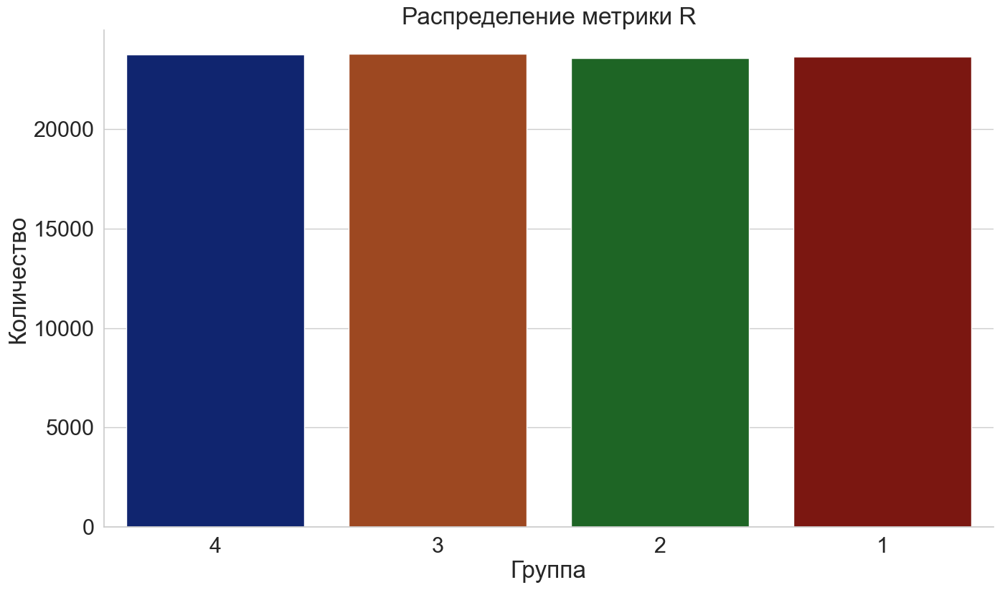

In [61]:
# Распределение метрики R

sns.barplot(x=r.index, y=r.values)
plt.xlabel('Группа')
plt.ylabel('Количество')
plt.title('Распределение метрики R')

sns.despine()

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


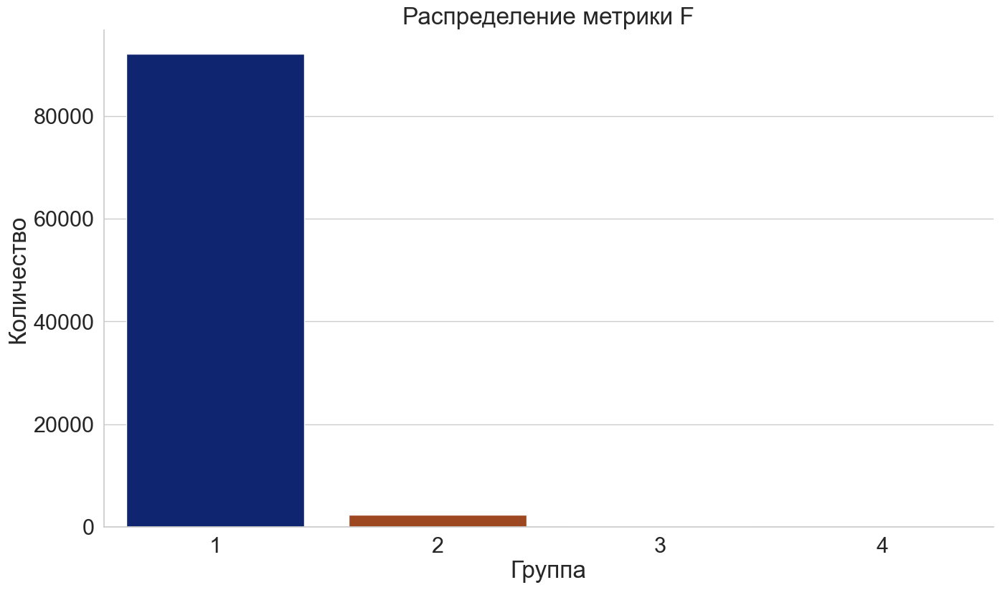

In [62]:
# Распределение метрики F

sns.barplot(x=f.index, y=f.values)
plt.xlabel('Группа')
plt.ylabel('Количество')
plt.title('Распределение метрики F')

sns.despine()

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


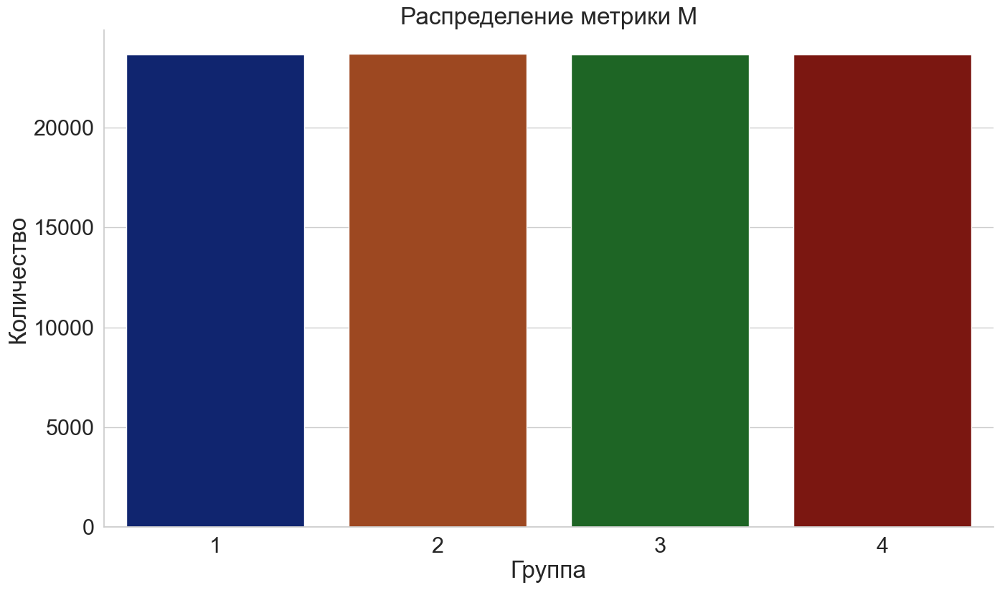

In [63]:
# Распределение метрики M

sns.barplot(x=m.index, y=m.values)
plt.xlabel('Группа')
plt.ylabel('Количество')
plt.title('Распределение метрики M')

sns.despine()

Распределение R и M более-менее ровное, по F - провал, мало кто к нам возвращается.

In [64]:
# Посмотрим, как вообще распределены деньги по RFM-группам, кто важнее всего для нас
rfm_money = rfm_table \
    .groupby('RFM', as_index=False) \
    .agg({'monetary': 'sum', 'customer_unique_id': 'count'}) \
    .sort_values('monetary') \
    .reset_index(drop=True)

pd.set_option('display.max_rows', None) # Посмотрим все строки.
rfm_money

,RFM,monetary,customer_unique_id
0,141,38.60,1
1,232,48.80,1
2,332,82.88,1
3,131,92.10,3
4,142,126.00,2
5,132,132.09,2
6,432,211.96,3
7,133,357.55,3
8,144,399.70,1
9,233,525.37,4


У нас даже не все группы представлены (всего их может быть 64).  
Как видим, основную массу покупателей, приносящую наибольший доход, составляют категории с F=1

In [65]:
# Отсортируем по группам, убедимся в этом
rfm_money.sort_values('RFM')

,RFM,monetary,customer_unique_id
38,111,174955.39,6044
41,112,382639.77,5900
43,113,640424.37,5551
50,114,2023999.45,5607
12,121,806.52,24
17,122,4858.82,69
24,123,16156.71,132
31,124,100505.56,259
3,131,92.10,3
5,132,132.09,2


In [66]:
# Вернём настройки отображения датафрейма
pd.set_option('display.max_rows', 10)

Подумаем, как разбить покупателей на сегменты по RFM-группам.   
Выделим 13 сегментов:
<ul>
<li>Best Customers: покупали недавно, часто и дорого</li>
<li>Good Customers: покупали недавно, часто, но на меньшие суммы</li>
<li>Spending Loyalists: покупают регулярно, много тратят, средняя recency</li>
<li>Regular Loyalists: покупают регулярно, но немного, средняя recency</li>
<li>Potential Loyalist: недавние покупатели со средней частотой</li>
<li>Regular Novices: покупали недавно, но мало и нечасто</li>
<li>Perspective Novices: покупали недавно и много, хоть и нечасто</li>
<li>Promising: покупали недавно (чуть давнее предыдущей группы)</li>
<li>Need Attention: частота и недавность средние</li>
<li>About To Sleep: частота и надавность ниже среднего</li>
<li>Can’t Lose Them: максимальная частота, но давно не приходили к нам</li>
<li>At Risk: покупали часто, но давно</li>
<li>Hibernating: покупали давно и редко</li>
</ul>

In [67]:
# Распределим RFM-группы по сегментам.
segt_map = {
    r'4[3-4][3-4]': 'Best Customers',
    r'4[3-4][1-2]': 'Good Customers',
    r'[2-3][3-4][3-4]': 'Spending Loyalists',
    r'[2-3][3-4][1-2]': 'Regular Loyalists',
    r'[3-4]2.': 'Potential Loyalist',
    r'41[1-2]': 'Regular Novices',
    r'41[3-4]': 'Perspective Novices',
    r'31.': 'Promising',
    r'22.': 'Need Attention',
    r'21.': 'About To Sleep',
    r'14.': 'Can\'t Lose Them',
    r'1[2-3].': 'At Risk',
    r'11.': 'Hibernating',
}

rfm_table['segment'] = rfm_table['RFM'].replace(segt_map, regex=True)

In [68]:
rfm_table.head(10) # Получилось

,customer_unique_id,recency,frequency,monetary,R,F,M,RFM,segment
0,0000366f3b9a7992bf8c76cfdf3221e2,235,1,129.90,4,1,3,413,Perspective Novices
1,0000b849f77a49e4a4ce2b2a4ca5be3f,238,1,18.90,4,1,1,411,Regular Novices
2,0000f46a3911fa3c0805444483337064,661,1,69.00,1,1,2,112,Hibernating
3,0000f6ccb0745a6a4b88665a16c9f078,445,1,25.99,2,1,1,211,About To Sleep
4,0004aac84e0df4da2b147fca70cf8255,412,1,180.00,2,1,4,214,About To Sleep
5,0004bd2a26a76fe21f786e4fbd80607f,270,1,154.00,3,1,3,313,Promising
6,00050ab1314c0e55a6ca13cf7181fecf,255,1,27.99,3,1,1,311,Promising
7,00053a61a98854899e70ed204dd4bafe,306,1,382.00,3,1,4,314,Promising
8,0005e1862207bf6ccc02e4228effd9a0,667,1,135.00,1,1,3,113,Hibernating
9,0005ef4cd20d2893f0d9fbd94d3c0d97,294,1,104.90,3,1,3,313,Promising


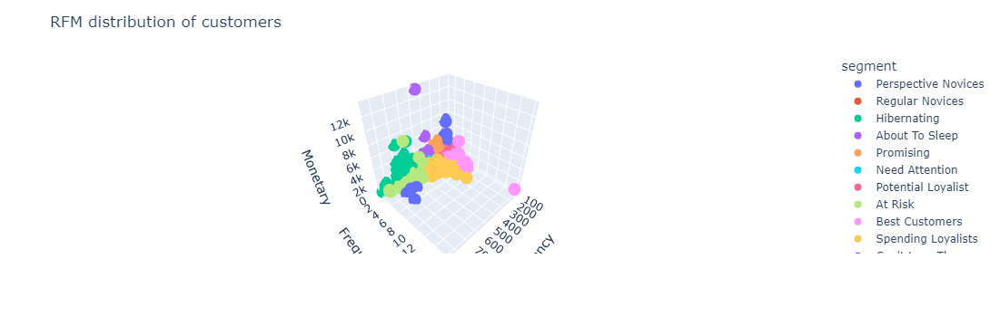

In [69]:
# А не визуализировать ли нам?
# Создание трехмерного скаттерплота
fig = px.scatter_3d(
    rfm_table, 
    x='recency',
    y='frequency', 
    z='monetary', 
    color='segment', 
    hover_name='customer_unique_id'
)

# Настройка внешнего вида графика
fig.update_layout(
    scene=dict(
        xaxis_title='Recency',
        yaxis_title='Frequency',
        zaxis_title='Monetary'
    ),
    title='RFM distribution of customers'
)
# Отображение графика
fig.show()

Составим датафрейм с характеристиками и описанием наших сегментов.

In [70]:
# Начнём с группировки для определения количества покупателей и принесённых денег.
rfm_segments = rfm_table \
    .groupby('segment', as_index=False) \
    .agg({'customer_unique_id': 'count', 'monetary': 'sum'}) \
    .rename(columns=({'customer_unique_id': 'number_of_customers', 'monetary': 'money'}))
rfm_segments

,segment,number_of_customers,money
0,About To Sleep,22933,3149552.68
1,At Risk,511,128848.13
2,Best Customers,72,39069.29
3,Can't Lose Them,4,564.30
4,Good Customers,3,211.96
...,...,...,...
8,Potential Loyalist,1345,332698.03
9,Promising,23056,3149082.50
10,Regular Loyalists,2,131.68
11,Regular Novices,11648,549140.04


In [71]:
# Сделаем датафрейм  с границами сегментов
segment_borders = pd.DataFrame({
    'Best Customers': [
        recency_borders[0], 
        recency_borders[1], 
        frequency_borders[2], 
        frequency_borders[4],
        monetary_borders[2],
        monetary_borders[4]
    ],
    'Good Customers': [
        recency_borders[0], 
        recency_borders[1], 
        frequency_borders[2], 
        frequency_borders[4],
        monetary_borders[0],
        monetary_borders[2]
    ],
    'Spending Loyalists': [
        recency_borders[1], 
        recency_borders[3], 
        frequency_borders[2], 
        frequency_borders[4],
        monetary_borders[2],
        monetary_borders[4]
    ],
    'Regular Loyalists': [
        recency_borders[1], 
        recency_borders[3], 
        frequency_borders[2], 
        frequency_borders[4],
        monetary_borders[0],
        monetary_borders[2]
    ],
    'Potential Loyalist': [
        recency_borders[0], 
        recency_borders[2], 
        frequency_borders[1], 
        frequency_borders[2],
        monetary_borders[0],
        monetary_borders[4]
    ],
    'Regular Novices': [
        recency_borders[0], 
        recency_borders[1], 
        frequency_borders[0], 
        frequency_borders[1],
        monetary_borders[0],
        monetary_borders[2]
    ],
    'Perspective Novices': [
        recency_borders[0], 
        recency_borders[1], 
        frequency_borders[0], 
        frequency_borders[1],
        monetary_borders[2],
        monetary_borders[4]
    ],
    'Promising': [
        recency_borders[1], 
        recency_borders[2], 
        frequency_borders[0], 
        frequency_borders[1],
        monetary_borders[0],
        monetary_borders[4]
    ],
    'Need Attention': [
        recency_borders[2], 
        recency_borders[3], 
        frequency_borders[1], 
        frequency_borders[2],
        monetary_borders[0],
        monetary_borders[4]
    ],
    'About To Sleep': [
        recency_borders[2], 
        recency_borders[3], 
        frequency_borders[0], 
        frequency_borders[1],
        monetary_borders[0],
        monetary_borders[4]
    ],
    'Can\'t Lose Them': [
        recency_borders[3], 
        recency_borders[4], 
        frequency_borders[3], 
        frequency_borders[4],
        monetary_borders[0],
        monetary_borders[4]
    ],
    'At Risk': [
        recency_borders[3], 
        recency_borders[4], 
        frequency_borders[1], 
        frequency_borders[3],
        monetary_borders[0],
        monetary_borders[4]
    ],
    'Hibernating': [
        recency_borders[3], 
        recency_borders[4], 
        frequency_borders[0], 
        frequency_borders[1],
        monetary_borders[0],
        monetary_borders[4]
    ]
}, index=[
    'lower_recency_bound',
    'upper_recency_bound',
    'lower_frequency_bound',
    'upper_frequency_bound',
    'lower_monetary_bound',
    'upper_monetary_bound'
]
).T.reset_index().rename(columns={'index': 'segment'})
segment_borders

,segment,lower_recency_bound,upper_recency_bound,lower_frequency_bound,upper_frequency_bound,lower_monetary_bound,upper_monetary_bound
0,Best Customers,0.0,238.0,2.0,16.0,89.8,13440.0
1,Good Customers,0.0,238.0,2.0,16.0,0.0,89.8
2,Spending Loyalists,238.0,471.0,2.0,16.0,89.8,13440.0
3,Regular Loyalists,238.0,471.0,2.0,16.0,0.0,89.8
4,Potential Loyalist,0.0,343.0,1.0,2.0,0.0,13440.0
...,...,...,...,...,...,...,...
8,Need Attention,343.0,471.0,1.0,2.0,0.0,13440.0
9,About To Sleep,343.0,471.0,0.0,1.0,0.0,13440.0
10,Can't Lose Them,471.0,848.0,3.0,16.0,0.0,13440.0
11,At Risk,471.0,848.0,1.0,3.0,0.0,13440.0


In [72]:
# Склеим датафреймы
rfm_segments_final = rfm_segments.merge(segment_borders, on='segment')
rfm_segments_final

,segment,number_of_customers,money,lower_recency_bound,upper_recency_bound,lower_frequency_bound,upper_frequency_bound,lower_monetary_bound,upper_monetary_bound
0,About To Sleep,22933,3149552.68,343.0,471.0,0.0,1.0,0.0,13440.0
1,At Risk,511,128848.13,471.0,848.0,1.0,3.0,0.0,13440.0
2,Best Customers,72,39069.29,0.0,238.0,2.0,16.0,89.8,13440.0
3,Can't Lose Them,4,564.30,471.0,848.0,3.0,16.0,0.0,13440.0
4,Good Customers,3,211.96,0.0,238.0,2.0,16.0,0.0,89.8
...,...,...,...,...,...,...,...,...,...
8,Potential Loyalist,1345,332698.03,0.0,343.0,1.0,2.0,0.0,13440.0
9,Promising,23056,3149082.50,238.0,343.0,0.0,1.0,0.0,13440.0
10,Regular Loyalists,2,131.68,238.0,471.0,2.0,16.0,0.0,89.8
11,Regular Novices,11648,549140.04,0.0,238.0,0.0,1.0,0.0,89.8


In [73]:
# Проверим деньги
rfm_segments_final.money.sum().round(2) == sum_3

True

In [74]:
# Ничего не потеряли.

In [75]:
# Отсортируем по деньгам
pd.set_option('display.max_rows', 20)
rfm_segments_final.sort_values('money', ascending=False)

,segment,number_of_customers,money,lower_recency_bound,upper_recency_bound,lower_frequency_bound,upper_frequency_bound,lower_monetary_bound,upper_monetary_bound
5,Hibernating,23102,3222018.98,471.0,848.0,0.0,1.0,0.0,13440.0
0,About To Sleep,22933,3149552.68,343.0,471.0,0.0,1.0,0.0,13440.0
9,Promising,23056,3149082.50,238.0,343.0,0.0,1.0,0.0,13440.0
7,Perspective Novices,11323,2672034.74,0.0,238.0,0.0,1.0,89.8,13440.0
11,Regular Novices,11648,549140.04,0.0,238.0,0.0,1.0,0.0,89.8
8,Potential Loyalist,1345,332698.03,0.0,343.0,1.0,2.0,0.0,13440.0
6,Need Attention,587,144733.61,343.0,471.0,1.0,2.0,0.0,13440.0
1,At Risk,511,128848.13,471.0,848.0,1.0,3.0,0.0,13440.0
12,Spending Loyalists,99,44578.83,238.0,471.0,2.0,16.0,89.8,13440.0
2,Best Customers,72,39069.29,0.0,238.0,2.0,16.0,89.8,13440.0


## Выводы, рекомендации
Задание сделано, но, кажется, RFM-сегментация не очень хорошо подходит для этого случая: большинство клиентов совершает всего одну покупку, мало лояльных покупателей. Неудивительно, что магазин перестал работать. Возможно, работа с группами
Promising, Perspective Novices, Regular Novices, Potential Loyalist переведёт некоторых из них в категории Best Customers, Good Customers, Regular Loyalists, Spending Loyalists - тогда дела пойдут лучше.